# Tugas Analisis Multimedia: **Image (Citra Digital)**

**Mata Kuliah:** Sistem & Teknologi Multimedia  
**Nama:** Rayhan Fatih GUnawan
**NIM:** 122140134 

---

## Deskripsi Tugas

Tugas ini bertujuan untuk memahami **representasi dasar data citra digital (image)** melalui praktik langsung memuat data, visualisasi komponen warna, serta melakukan analisis spasial sederhana menggunakan berbagai teknik dasar pengolahan citra.

Anda akan bekerja dengan satu atau beberapa gambar (foto diri, objek, atau lingkungan sekitar) untuk:

* Mengamati struktur data piksel dan channel warna (RGB, Grayscale, HSV, dsb.)
* Menganalisis perbedaan hasil visualisasi antar representasi warna
* Melakukan eksplorasi sederhana terhadap transformasi citra (cropping, filtering, edge detection, dll.)
* Menyimpulkan pengaruh setiap tahap pemrosesan terhadap persepsi visual

Fokus tugas ini adalah pada **pemahaman konsep representasi spasial citra digital** dan **interpretasi hasil visualisasi**, **bukan** pada manipulasi kompleks atau penerapan model pembelajaran mesin.

### **Soal 1 — Cropping dan Konversi Warna**

* Ambil sebuah gambar diri Anda (*selfie*) menggunakan kamera atau smartphone.
* Lakukan **cropping secara manual** untuk menghasilkan dua potongan:

  * Cropping **kotak persegi pada area wajah**.
  * Cropping **persegi panjang pada area latar belakang**.
* Resize hasil crop menjadi **920×920 piksel**.
* Konversi gambar menjadi **grayscale** dan **HSV**, lalu tampilkan ketiganya berdampingan.
* Tambahkan **anotasi teks** berisi nama Anda di atas kepala pada gambar hasil crop.

  * Gaya teks (font, warna, posisi, ukuran, ketebalan) **dibebaskan**.
* Jelaskan efek **cropping** dan **perubahan warna** menggunakan **Markdown**.


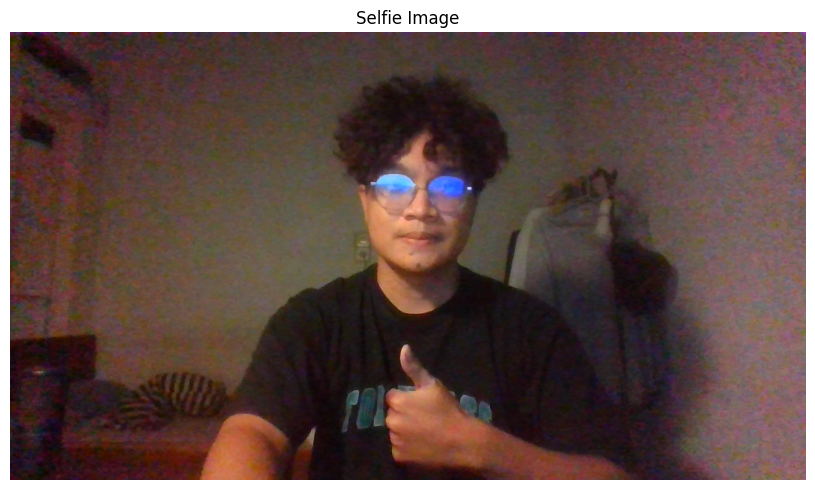

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

img_path = os.path.join("assets_ws4", "selfie.jpg" )

img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))
plt.imshow(img_rgb)
plt.title('Selfie Image')
plt.axis('off')
plt.tight_layout()
plt.show()

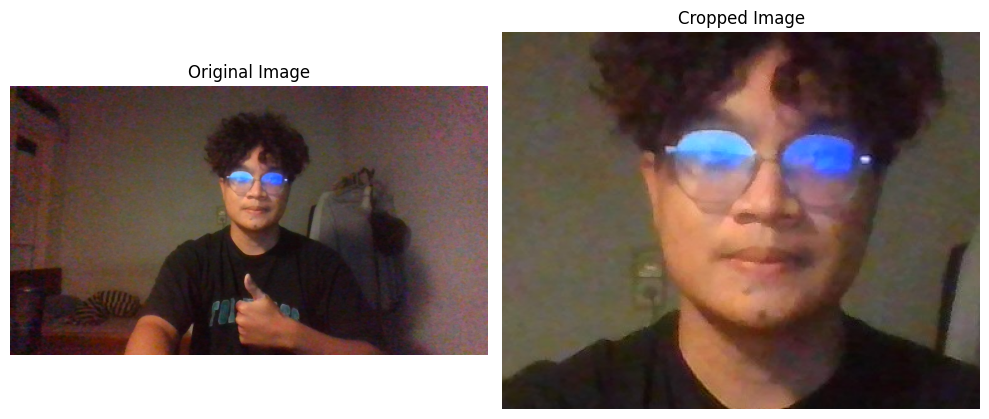

In [8]:
img_cropped = img_rgb[150:450, 450:830]

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img_rgb)
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(img_cropped)
axs[1].set_title('Cropped Image')
axs[1].axis('off')
plt.tight_layout()
plt.show()

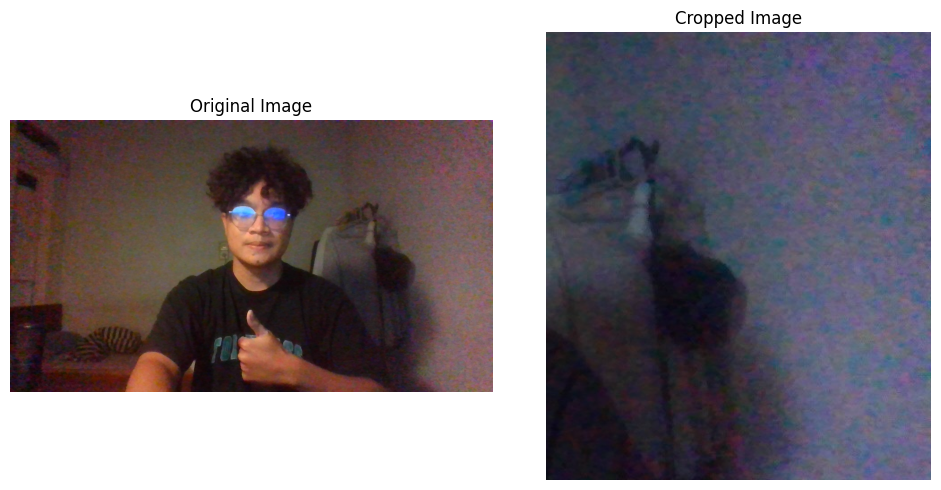

In [9]:
img_cropped_2 = img_rgb[100:600, 850:1280]

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img_rgb)
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(cv2.cvtColor(img_cropped_2, cv2.COLOR_BGR2RGB))
axs[1].set_title('Cropped Image')
axs[1].axis('off')
plt.tight_layout()
plt.show()

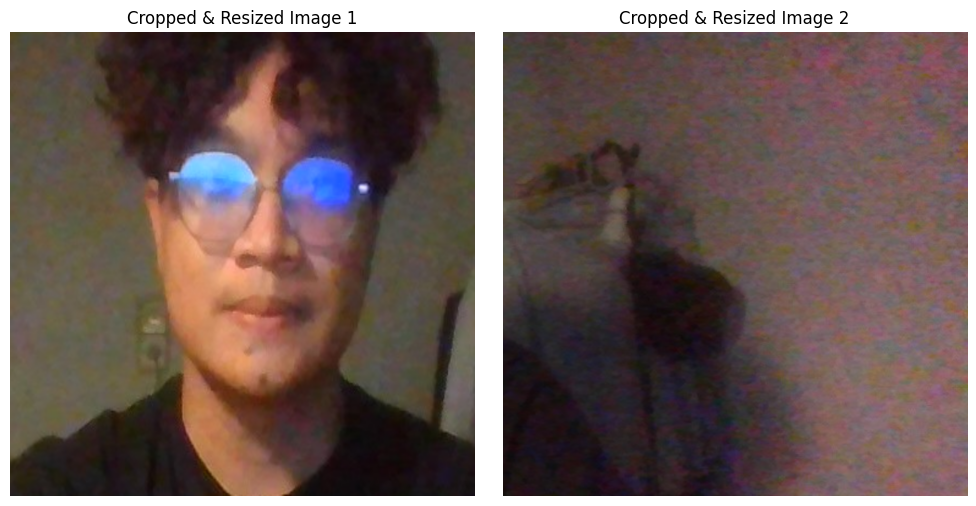

In [10]:
img_cropped_resized = cv2.resize(img_cropped, (920, 920))
img_cropped_resized_2 = cv2.resize(img_cropped_2, (920, 920))

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(img_cropped_resized)
axs[0].set_title('Cropped & Resized Image 1')
axs[0].axis('off')

axs[1].imshow(img_cropped_resized_2)
axs[1].set_title('Cropped & Resized Image 2')
axs[1].axis('off')
plt.tight_layout()
plt.show()


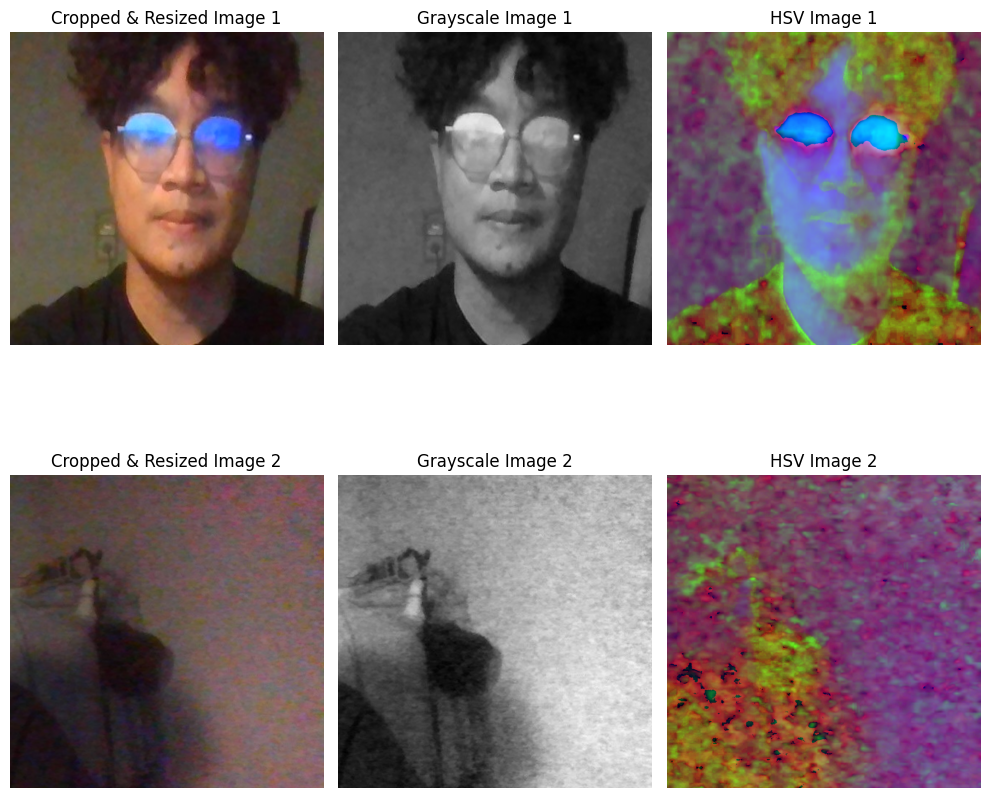

In [11]:
img_gray = cv2.cvtColor(img_cropped_resized, cv2.COLOR_BGR2GRAY)
img_hsv = cv2.cvtColor(img_cropped_resized, cv2.COLOR_BGR2HSV)

img_gray_2 = cv2.cvtColor(img_cropped_resized_2, cv2.COLOR_BGR2GRAY)
img_hsv_2 = cv2.cvtColor(img_cropped_resized_2, cv2.COLOR_BGR2HSV)

fig, axs = plt.subplots(2, 3, figsize=(10, 10))
axs[0, 0].imshow(img_cropped_resized)
axs[0, 0].set_title('Cropped & Resized Image 1')
axs[0, 0].axis('off')

axs[0, 1].imshow(img_gray, cmap='gray')
axs[0, 1].set_title('Grayscale Image 1')
axs[0, 1].axis('off')

axs[0, 2].imshow(img_hsv)
axs[0, 2].set_title('HSV Image 1')
axs[0, 2].axis('off')

axs[1, 0].imshow(img_cropped_resized_2)
axs[1, 0].set_title('Cropped & Resized Image 2')
axs[1, 0].axis('off')

axs[1, 1].imshow(img_gray_2, cmap='gray')
axs[1, 1].set_title('Grayscale Image 2')
axs[1, 1].axis('off')

axs[1, 2].imshow(img_hsv_2)
axs[1, 2].set_title('HSV Image 2')
axs[1, 2].axis('off')

plt.tight_layout()
plt.show()

### **Soal 2 — Manipulasi Channel Warna RGB**

* Gunakan gambar hasil crop dari Soal 1.
* Konversikan gambar ke ruang warna **RGB**.
* Lakukan manipulasi channel warna dengan cara:

  * **Naikkan intensitas channel merah sebanyak 50 poin** (maksimum 255).
  * **Turunkan intensitas channel biru sebanyak 30 poin** (minimum 0).
* Teknik atau cara menaikkan/menurunkan intensitas **dibebaskan**, asalkan logis dan hasilnya terlihat.
* Gabungkan kembali channel warna dan **simpan gambar hasil modifikasi dalam format `.png`**.
* **Tampilkan histogram per channel (R, G, B)** untuk gambar asli dan hasil modifikasi menggunakan `matplotlib.pyplot.hist`.
* Jelaskan dampak perubahan RGB pada warna gambar dalam sel **Markdown**.


Shape of RGB Image 1: (920, 920, 3)


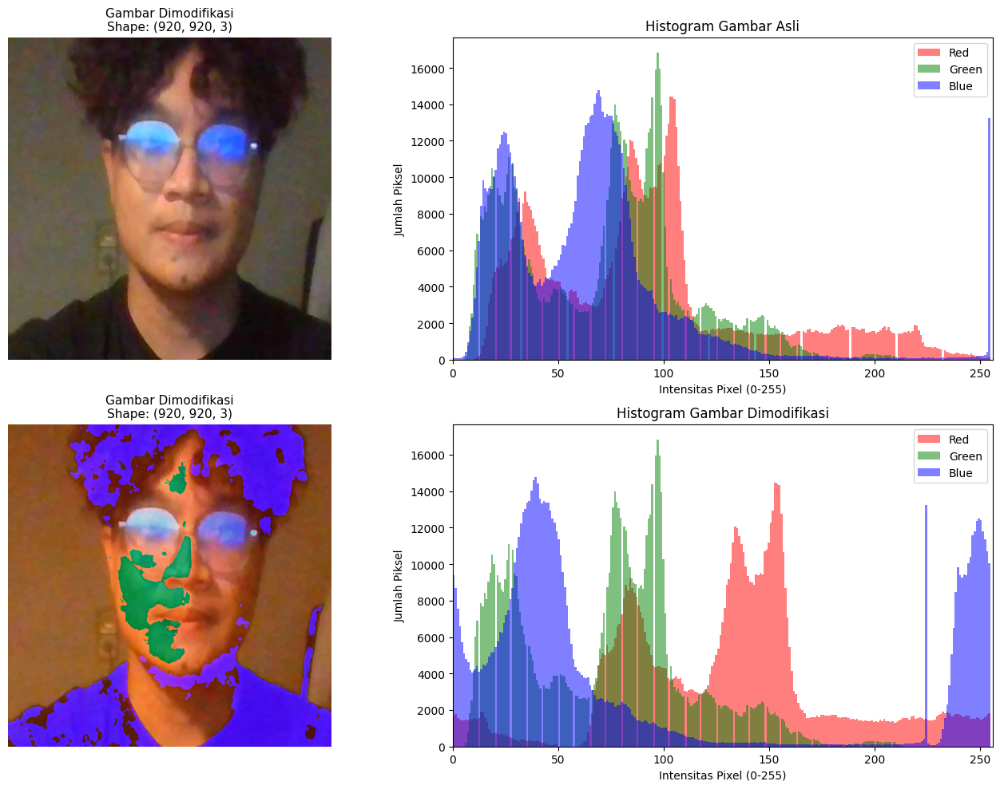

In [14]:
print("Shape of RGB Image 1:", img_cropped_resized.shape)

img2_modified = img_cropped_resized.copy()
img2_modified[:,:, 0] += 50  # Increase Red channel intensity
img2_modified[:, :, 2] -= 30  # Decrease Blue channel intensity

fig, axs = plt.subplots(2, 2, figsize=(14, 10))

colors = ('r','g','b')
labels = ('Red','Green','Blue')

axs[0,0].imshow(img_cropped_resized)
axs[0,0].set_title(f"Gambar Dimodifikasi\nShape: {img_cropped_resized.shape}", fontsize=11)
axs[0,0].axis('off')

for i, color in enumerate(colors):
    axs[0, 1].hist(img_cropped_resized[:, :, i].ravel(), bins=256, color=color, alpha=0.5)
axs[0, 1].set_title('Histogram Gambar Asli')
axs[0,1].set_xlabel("Intensitas Pixel (0-255)")
axs[0,1].set_ylabel("Jumlah Piksel")
axs[0, 1].set_xlim([0, 256])
axs[0, 1].legend(labels)

axs[1, 0].imshow(img2_modified)
axs[1, 0].set_title(f"Gambar Dimodifikasi\nShape: {img2_modified.shape}", fontsize=11)
axs[1, 0].axis('off')

for i, color in enumerate(colors):
    axs[1, 1].hist(img2_modified[:, :, i].ravel(), bins=256, color=color, alpha=0.5)
axs[1, 1].set_title('Histogram Gambar Dimodifikasi')
axs[1, 1].set_xlabel("Intensitas Pixel (0-255)")
axs[1, 1].set_ylabel("Jumlah Piksel")
axs[1, 1].set_xlim([0, 256])
axs[1, 1].legend(labels)
plt.tight_layout()  
plt.show()



## Dapmpak perubahan RGB



### **Soal 3 — Deteksi Tepi dan Filter Citra**

* Ambil gambar **objek dengan background bertekstur** (misalnya kain bermotif, jerami, atau batu).
* Terapkan **edge detection (Canny)** dan tampilkan hasilnya.
* Lakukan **thresholding dengan nilai ambang tertentu** (bebas Anda tentukan) agar hanya objek utama yang tersisa.
* Buat **bounding box** di sekitar objek hasil segmentasi (boleh manual atau otomatis).
* Terapkan **filter blur** dan **filter sharpening**, lalu **bandingkan hasil keduanya**.
* Jelaskan bagaimana setiap filter memengaruhi detail gambar dalam format **Markdown**.


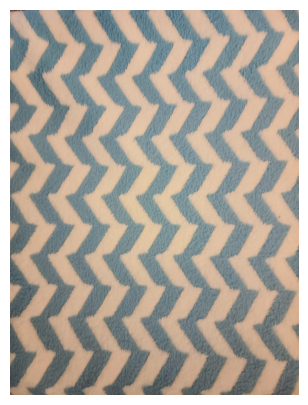

In [15]:
img_motif = os.path.join("assets_ws4", "motif.jpg" )
img2= cv2.imread(img_motif)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 5))
plt.axis('off')
plt.imshow(img2_rgb)

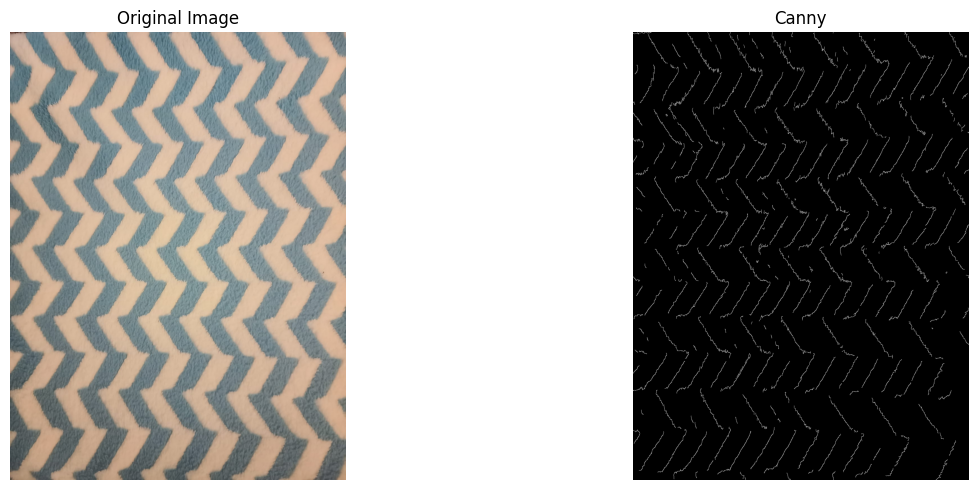

In [16]:

edges = cv2.Canny(img2_rgb, 100, 200)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].imshow(img2_rgb)
axs[0].set_title('Original Image')
axs[0].axis('off')
axs[1].imshow(edges, cmap='gray')
axs[1].set_title('Canny')
axs[1].axis('off')
plt.tight_layout()
plt.show()

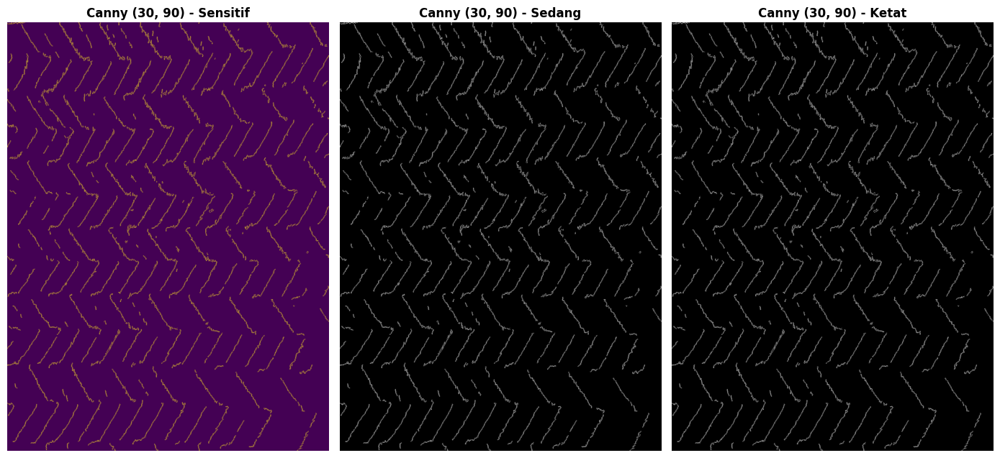

In [17]:
img_blur_rgb = cv2.cvtColor(edges, cv2.COLOR_BGR2RGB)

edges_low = cv2.Canny(img_blur_rgb, 50, 150)
edges_mid = cv2.Canny(img_blur_rgb, 100, 200)
edges_high = cv2.Canny(img_blur_rgb, 200, 250)

fig, axs = plt.subplots(1, 3, figsize=(14, 10))
axs[0].imshow(edges_low)
axs[0].set_title("Canny (30, 90) - Sensitif", fontsize=12, fontweight='bold')
axs[0].axis('off')
axs[1].imshow(edges_mid, cmap='gray')
axs[1].set_title("Canny (30, 90) - Sedang", fontsize=12, fontweight='bold')
axs[1].axis('off')
axs[2].imshow(edges_high, cmap='gray')
axs[2].set_title("Canny (30, 90) - Ketat", fontsize=12, fontweight='bold')
axs[2].axis('off')

plt.tight_layout()
plt.show()

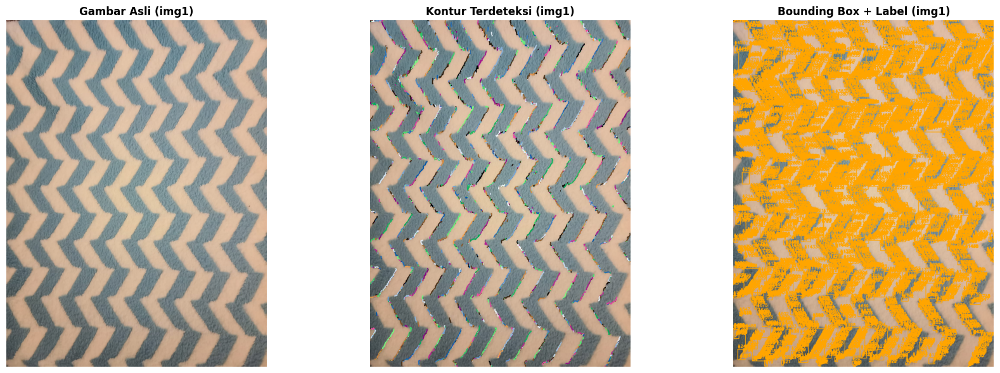

In [18]:
contours_img, hierarchy_img = cv2.findContours(edges_high, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

img_contours = img2.copy()
for idx, c in enumerate(contours_img):
    # Warna berbeda untuk tiap objek
    color = (
        int((idx * 50) % 255),
        int((idx * 100) % 255),
        int((idx * 150) % 255)
    )
    cv2.drawContours(img_contours, [c], -1, color, 2)

img_boxes = img2.copy()
for idx, c in enumerate(contours_img):
    # Hitung bounding box
    x, y, w, h = cv2.boundingRect(c)
    area = cv2.contourArea(c)
    
    # Warna berdasarkan ukuran
    if area > 5000:
        color = (255, 0, 0)  # Biru untuk objek besar
        thickness = 3
    elif area > 2000:
        color = (0, 255, 0)  # Hijau untuk objek sedang
        thickness = 2
    else:
        color = (0, 165, 255)  # Orange untuk objek kecil
        thickness = 2
    
    # Gambar rectangle
    cv2.rectangle(img_boxes, (x, y), (x + w, y + h), color, thickness)
    
    # Tambahkan label
    label = f"#{idx+1}"
    cv2.putText(img_boxes, label, (x, y-8), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
    

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
axes[0].set_title("Gambar Asli (img1)", fontsize=12, fontweight='bold')
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(img_contours, cv2.COLOR_BGR2RGB))
axes[1].set_title("Kontur Terdeteksi (img1)", fontsize=12, fontweight='bold')
axes[1].axis("off")

axes[2].imshow(cv2.cvtColor(img_boxes, cv2.COLOR_BGR2RGB))
axes[2].set_title("Bounding Box + Label (img1)", fontsize=12, fontweight='bold')
axes[2].axis("off")

plt.tight_layout()
plt.show()

### **Soal 4 — Deteksi Wajah dan Filter Digital Kreatif**

* Ambil gambar diri Anda dengan ekspresi wajah **netral**.
* Lakukan **deteksi wajah dan landmark** menggunakan salah satu dari:

  * **MediaPipe**, atau
  * **Dlib**, atau
  * **OpenCV**.
* Buat **overlay filter digital kreatif** karya Anda sendiri, misalnya:

  * topi, kumis, masker, helm, aksesoris, atau bentuk unik lainnya.
  * Filter boleh dibuat dari **gambar eksternal (PNG)** *atau* digambar langsung (misal bentuk lingkaran, garis, poligon, dll).
* Pastikan posisi overlay menyesuaikan **landmark wajah** dengan logis.
* **Gunakan alpha blending sebagai saran** agar hasil tampak lebih natural.
* Tampilkan perbandingan antara **gambar asli** dan **hasil dengan filter**.
* Jelaskan bagaimana Anda menghitung posisi overlay dan tantangan yang dihadapi selama implementasi (gunakan **Markdown**).

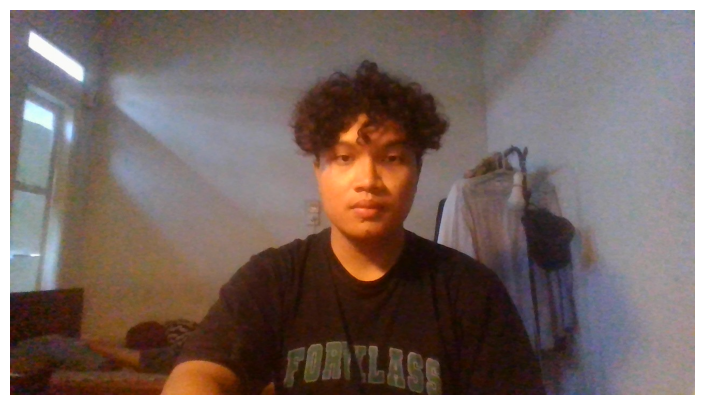

In [19]:
img_netral = os.path.join("assets_ws4", "netral.jpg" )
img3 = cv2.imread(img_netral)
img3_rgb = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))
plt.axis("off")
plt.imshow(img3_rgb)



In [20]:
import mediapipe as mp
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=2, min_detection_confidence=0.5)
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

results = face_mesh.process(img3_rgb)
if results.multi_face_landmarks:
    for face_landmarks in results.multi_face_landmarks:
        print(face_landmarks)

landmark {
  x: 0.523681283
  y: 0.498906672
  z: -0.0174487755
}
landmark {
  x: 0.524504
  y: 0.462560028
  z: -0.0328019336
}
landmark {
  x: 0.523795307
  y: 0.47380808
  z: -0.0170125347
}
landmark {
  x: 0.518989146
  y: 0.422265649
  z: -0.0248350706
}
landmark {
  x: 0.524689913
  y: 0.45029369
  z: -0.0349754766
}
landmark {
  x: 0.524601
  y: 0.434023857
  z: -0.0325891525
}
landmark {
  x: 0.524165213
  y: 0.394969344
  z: -0.0161152631
}
landmark {
  x: 0.477594882
  y: 0.388373703
  z: 0.00739797903
}
landmark {
  x: 0.524131477
  y: 0.365744412
  z: -0.0119983079
}
landmark {
  x: 0.524398148
  y: 0.349823743
  z: -0.0133808106
}
landmark {
  x: 0.524984
  y: 0.290781349
  z: -0.00691204332
}
landmark {
  x: 0.523521066
  y: 0.504595697
  z: -0.0166729037
}
landmark {
  x: 0.523318648
  y: 0.508924067
  z: -0.0144983372
}
landmark {
  x: 0.523113608
  y: 0.51075691
  z: -0.0116802454
}
landmark {
  x: 0.523323119
  y: 0.514153
  z: -0.0116182
}
landmark {
  x: 0.523304582

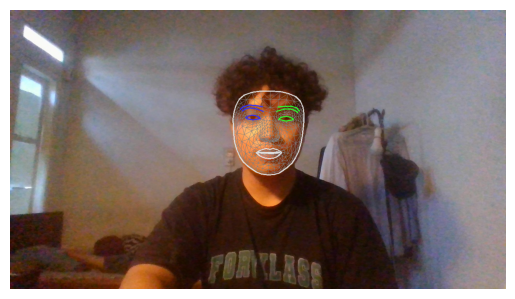

In [21]:
annotated_image = img3_rgb.copy()
for face_landmarks in results.multi_face_landmarks:
   mp_drawing.draw_landmarks(
       image=annotated_image,
       landmark_list=face_landmarks,
       connections=mp_face_mesh.FACEMESH_TESSELATION,
       landmark_drawing_spec=None,
       connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_tesselation_style())
   mp_drawing.draw_landmarks(
       image=annotated_image,
       landmark_list=face_landmarks,
       connections=mp_face_mesh.FACEMESH_CONTOURS,
       landmark_drawing_spec=None,
       connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_contours_style())
plt.imshow(annotated_image)
plt.axis('off')
plt.show()

(-0.5, 1279.5, 719.5, -0.5)

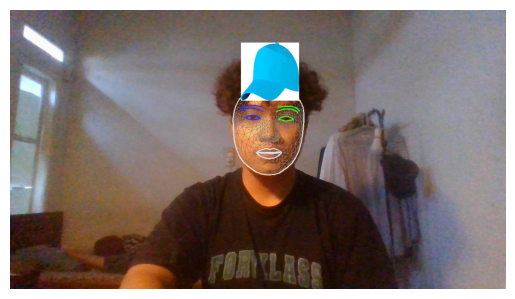

In [31]:

hat_path = os.path.join('assets_ws4', 'topi.png')

hat = cv2.imread(hat_path, cv2.IMREAD_UNCHANGED)

hat_resized = cv2.resize(hat, (150, 150))

for face_landmarks in results.multi_face_landmarks:
    # Dapatkan koordinat titik di dahi (misalnya titik 10)
    forehead_point = face_landmarks.landmark[10]
    h, w, _ = img3_rgb.shape
    x = int(forehead_point.x * w) - hat_resized.shape[1] // 2
    y = int(forehead_point.y * h) - hat_resized.shape[0] // 2 - 50  # Geser ke atas sedikit

    # Overlay topi pada gambar asli
    for i in range(hat_resized.shape[0]):
        for j in range(hat_resized.shape[1]):
            b, g, r, a = hat_resized[i, j]
            alpha = a / 255.0
            annotated_image[y+i, x+j] = (1 - alpha) * annotated_image[y+i, x+j] + alpha * np.array([b,g,r]) 

plt.imshow(annotated_image)
plt.axis('off')


### **Soal 5 — Perspektif dan Peningkatan Kualitas Citra**

* Ambil gambar **objek datar** seperti karya tangan di kertas, tulisan di papan tulis, atau foto produk di meja dengan kondisi pencahayaan atau sudut yang tidak ideal.
* Lakukan **preprocessing** untuk memperbaiki tampilan agar lebih rapi dan jelas, dengan langkah-langkah:

  * Konversi ke **grayscale**.
  * **Koreksi perspektif (transformasi homografi)** menggunakan **4 titik manual** agar objek terlihat sejajar dan tidak terdistorsi.
  * Terapkan **thresholding adaptif atau Otsu** (pilih salah satu, dan jelaskan alasan pilihan Anda).
* Tampilkan **setiap tahap pemrosesan dalam satu grid** agar mudah dibandingkan.
* Jelaskan fungsi masing-masing tahap dan bagaimana teknik ini meningkatkan kualitas visual citra (gunakan **Markdown**).

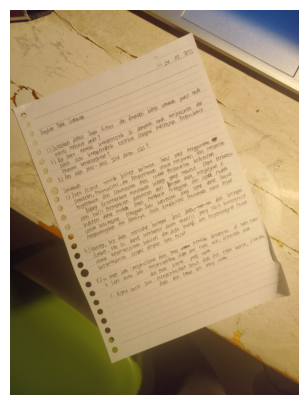

In [23]:
img_kertas = os.path.join("assets_ws4", "kertas.jpg" )
img4= cv2.imread(img_kertas)
img4_rgb = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 5))
plt.axis('off')
plt.imshow(img4_rgb)

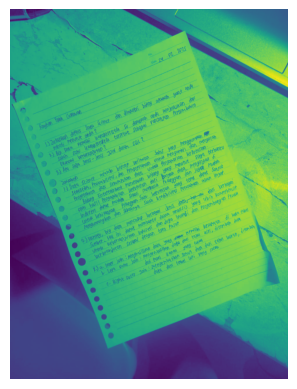

In [24]:
img_gray_3 = cv2.cvtColor(img4_rgb, cv2.COLOR_BGR2GRAY)
plt.imshow(img_gray_3, cmap='gray')
plt.axis('off')
plt.imshow(img_gray_3)

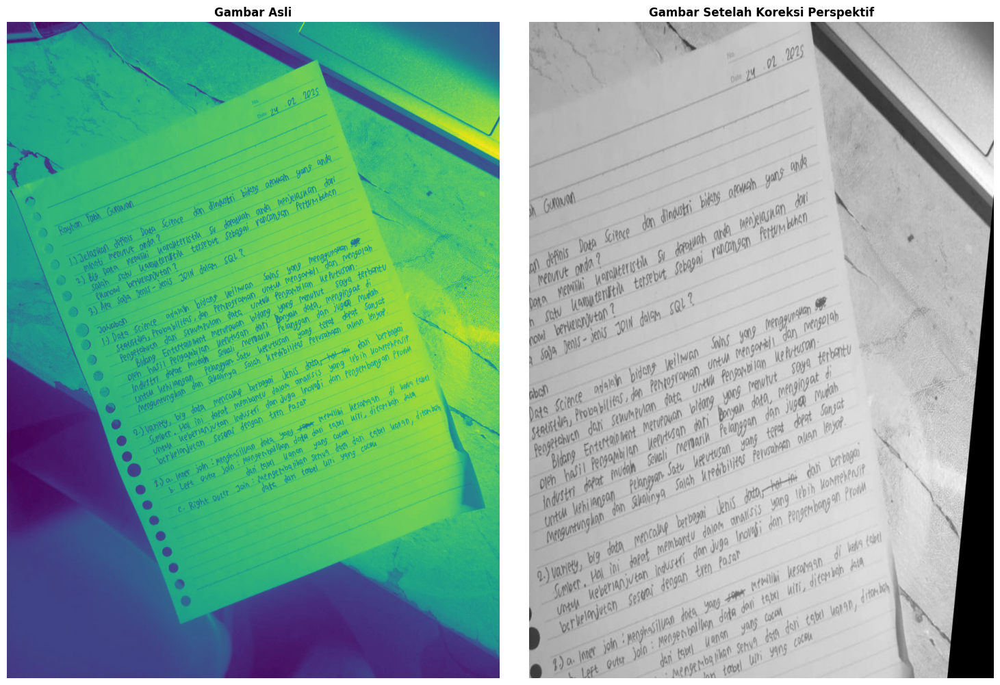

In [27]:
pts_src = np.float32([
    [140, 160],   # top-left
    [930, 60],    # top-right
    [1040, 840],  # bottom-right
    [250, 920]    # bottom-left
])

# --- ukuran output (A4 ratio: 1 : 1.414) ---
width = 900
height = int(width * 1.414)

pts_dst = np.float32([
    [0, 0],
    [width-1, 0],
    [width-1, height-1],
    [0, height-1]
])

# 3. Homografi
H, status = cv2.findHomography(pts_src, pts_dst)

# 4. Warp (luruskan gambar)
warped = cv2.warpPerspective(img_gray_3, H, (width, height))

# --- TAMPILKAN ---
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(img_gray_3)
axs[0].set_title('Gambar Asli', fontsize=12, fontweight='bold')
axs[0].axis('off')
axs[1].imshow(warped, cmap='gray')
axs[1].set_title('Gambar Setelah Koreksi Perspektif', fontsize=12, fontweight='bold')
axs[1].axis('off')
plt.tight_layout()
plt.show()


### **Aturan Umum Pengerjaan**

* Kerjakan secara **mandiri**.
* Bantuan AI (seperti ChatGPT, Copilot, dsb.) diperbolehkan **dengan bukti percakapan** (screenshot / link / script percakapan).
* Source code antar mahasiswa harus berbeda.
* Jika mendapat bantuan teman, tuliskan nama dan NIM teman yang membantu.
* Plagiarisme akan dikenakan sanksi sesuai aturan akademik ITERA.
* Cantumkan seluruh **credit dan referensi** yang digunakan di bagian akhir notebook.
* Penjelasan setiap soal ditulis dalam **Markdown**, bukan di dalam komentar kode.

---

### **Aturan Pengumpulan**

* Semua file kerja Anda (notebook `.ipynb`, gambar, dan hasil) **wajib diunggah ke GitHub repository tugas sebelumnya**.

  * Gunakan struktur folder berikut di dalam repo Anda:

    ```
    /Nama_NIM_Repo/ # Nama repo sebelumnya
      ├── assets_ws4/     # berisi semua gambar atau video asli (input)
      ├── results_ws4/    # berisi semua hasil modifikasi dan output
      ├── worksheet4.ipynb
      └── NIM_Worksheet4.pdf
    ```
* File yang dikumpulkan ke **Tally** hanya berupa **hasil PDF** dari notebook Anda, dengan format nama:

  ```
  NIM_Worksheet4.pdf
  ```
* Pastikan notebook telah dijalankan penuh sebelum diekspor ke PDF.
* Sertakan tautan ke repository GitHub Anda di bagian atas notebook atau di halaman pertama PDF.

---

### ✅ **Catatan Akhir**

> Worksheet 4 ini bertujuan mengasah pemahaman Anda tentang manipulasi citra digital secara praktis. Gunakan kreativitas Anda untuk menghasilkan hasil visual yang menarik dan penjelasan konseptual yang jelas.